# Importing Kaggle bike sharing dataset using API

In [ ]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

In [ ]:
!pip install kaggle

import os

# Make .kaggle directory
os.makedirs('/root/.kaggle', exist_ok=True)

# Move the kaggle.json into this new directory
!mv kaggle.json /root/.kaggle/kaggle.json

# Change the permissions of the file.
!chmod 600 /root/.kaggle/kaggle.json

# Set the environment variable (alternatively, you can set it in the command line)
os.environ['KAGGLE_CONFIG_DIR'] = "/root/.kaggle"

In [ ]:
#go to the kaggle page where the data is and click on 3 dots symbol next to download and select copy API command

!kaggle datasets download -d hmavrodiev/london-bike-sharing-dataset
# To see the files downloaded
!ls

In [ ]:
!unzip london-bike-sharing-dataset.zip

# Importing relevant libraries

In [49]:
import pandas as pd
import numpy as np
import tensorflow as tf
import seaborn as sns
from tensorflow import keras
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from pandas.plotting import register_matplotlib_converters

from pylab import rcParams
from matplotlib import rc
%matplotlib inline
%config InlineBackend.figure_format='retina'

register_matplotlib_converters()
sns.set(style='whitegrid', palette='muted', font_scale=1.5)

rcParams['figure.figsize'] = 22, 10

from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import RobustScaler


In [18]:
try:
    demand_data = pd.read_csv('london_merged.csv', encoding='ISO-8859-1')
except UnicodeDecodeError:
    # If 'ISO-8859-1' does not work, try 'cp1252'
    demand_data = pd.read_csv('london_merged.csv', encoding='cp1252')

demand_data.head()

,timestamp,cnt,t1,t2,hum,wind_speed,weather_code,is_holiday,is_weekend,season
0,2015-01-04 00:00:00,182,3.0,2.0,93.0,6.0,3.0,0.0,1.0,3.0
1,2015-01-04 01:00:00,138,3.0,2.5,93.0,5.0,1.0,0.0,1.0,3.0
2,2015-01-04 02:00:00,134,2.5,2.5,96.5,0.0,1.0,0.0,1.0,3.0
3,2015-01-04 03:00:00,72,2.0,2.0,100.0,0.0,1.0,0.0,1.0,3.0
4,2015-01-04 04:00:00,47,2.0,0.0,93.0,6.5,1.0,0.0,1.0,3.0


# Quick exploration, creating index etc

In [19]:
demand_data.info() #No missing data with 8760 records

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17414 entries, 0 to 17413
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   timestamp     17414 non-null  object 
 1   cnt           17414 non-null  int64  
 2   t1            17414 non-null  float64
 3   t2            17414 non-null  float64
 4   hum           17414 non-null  float64
 5   wind_speed    17414 non-null  float64
 6   weather_code  17414 non-null  float64
 7   is_holiday    17414 non-null  float64
 8   is_weekend    17414 non-null  float64
 9   season        17414 non-null  float64
dtypes: float64(8), int64(1), object(1)
memory usage: 1.3+ MB


In [20]:
demand_data['timestamp'] = pd.to_datetime(demand_data['timestamp'] )

In [ ]:
#set index
demand_data.set_index('timestamp', inplace=True)
demand_data.head()

In [22]:
demand_data.describe()

,cnt,t1,t2,hum,wind_speed,weather_code,is_holiday,is_weekend,season
count,17414.000000,17414.000000,17414.000000,17414.000000,17414.000000,17414.000000,17414.000000,17414.000000,17414.000000
mean,1143.101642,12.468091,11.520836,72.324954,15.913063,2.722752,0.022051,0.285403,1.492075
std,1085.108068,5.571818,6.615145,14.313186,7.894570,2.341163,0.146854,0.451619,1.118911
min,0.000000,-1.500000,-6.000000,20.500000,0.000000,1.000000,0.000000,0.000000,0.000000
25%,257.000000,8.000000,6.000000,63.000000,10.000000,1.000000,0.000000,0.000000,0.000000
50%,844.000000,12.500000,12.500000,74.500000,15.000000,2.000000,0.000000,0.000000,1.000000
75%,1671.750000,16.000000,16.000000,83.000000,20.500000,3.000000,0.000000,1.000000,2.000000
max,7860.000000,34.000000,34.000000,100.000000,56.500000,26.000000,1.000000,1.000000,3.000000


# EDA & Feature Extraction

<Axes: xlabel='timestamp', ylabel='cnt'>

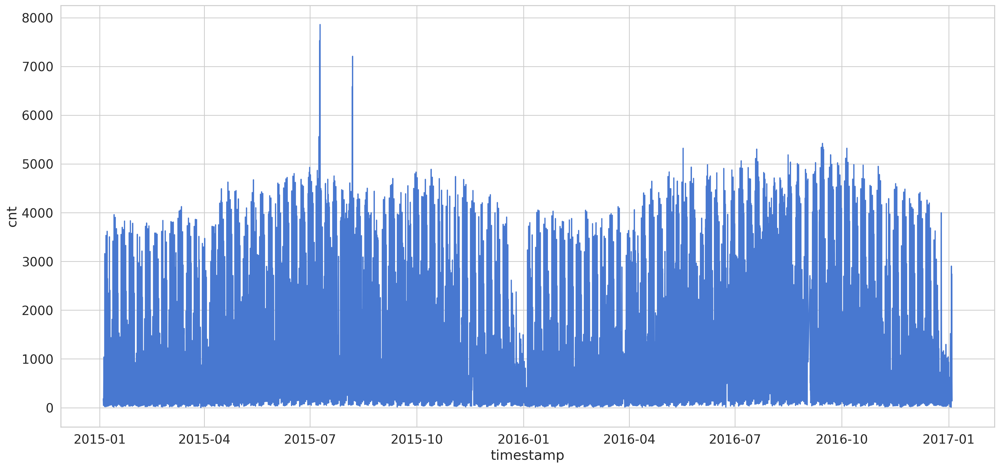

In [23]:
sns.lineplot(x=demand_data.index, y="cnt", data=demand_data)
#there is some sort of autocorrelation, seasonality and increasing trends etc

<Axes: xlabel='timestamp', ylabel='cnt'>

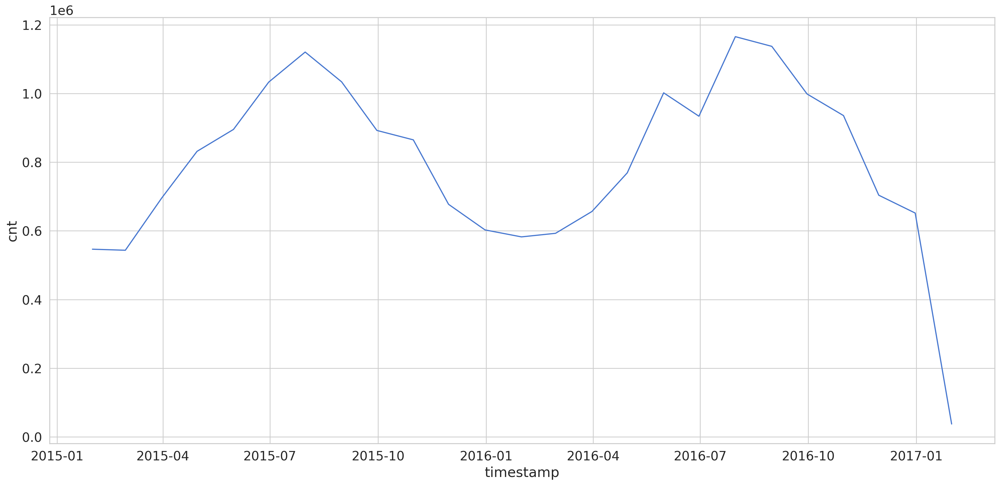

In [24]:
#Create month column and plot the trend
demand_data['month'] = demand_data.index.month

demand_data_by_month = demand_data.resample('M').sum() #resample aggregates the data indexed at datetime level at specified level
sns.lineplot(x=demand_data_by_month.index, y="cnt", data=demand_data_by_month) # Can see seasonaility

In [ ]:
demand_data['day_of_week'] = demand_data.index.dayofweek
demand_data['day_of_week'].value_counts()

In [ ]:
demand_data['Hour'] = demand_data.index.hour
demand_data['Hour'].value_counts()

<Axes: xlabel='Hour', ylabel='cnt'>

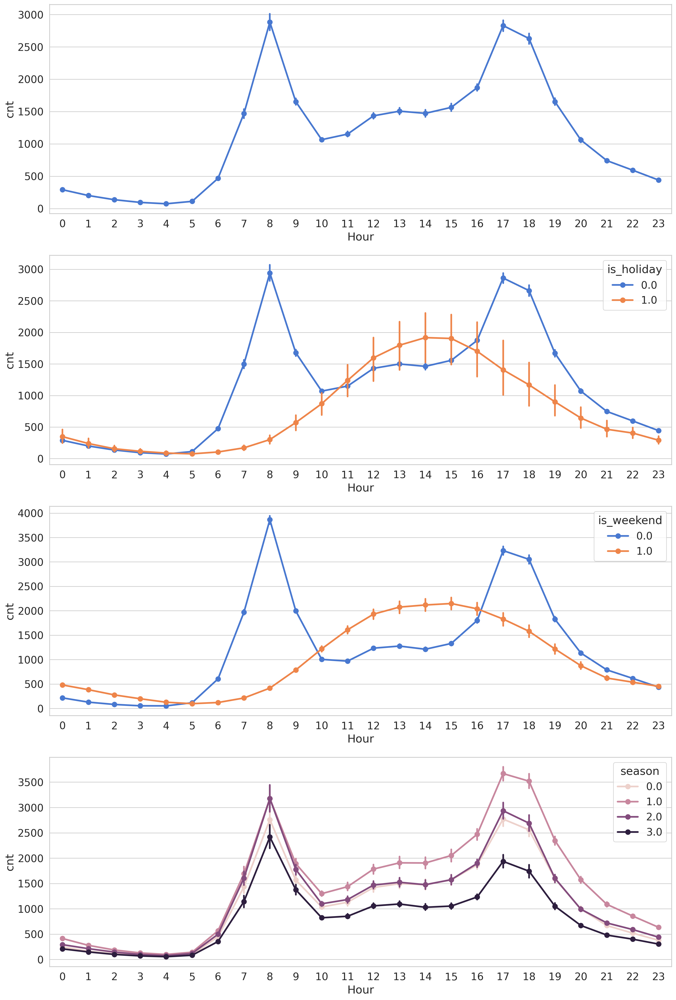

In [29]:
fig,(ax1, ax2, ax3, ax4)= plt.subplots(nrows=4)
fig.set_size_inches(18, 28)

sns.pointplot(data=demand_data, x='Hour', y='cnt',ax=ax1)
sns.pointplot(data=demand_data, x='Hour', y='cnt',hue='is_holiday',ax=ax2)
sns.pointplot(data=demand_data, x='Hour', y='cnt',hue='is_weekend',ax=ax3)
sns.pointplot(data=demand_data, x='Hour', y='cnt',hue='season',ax=ax4)

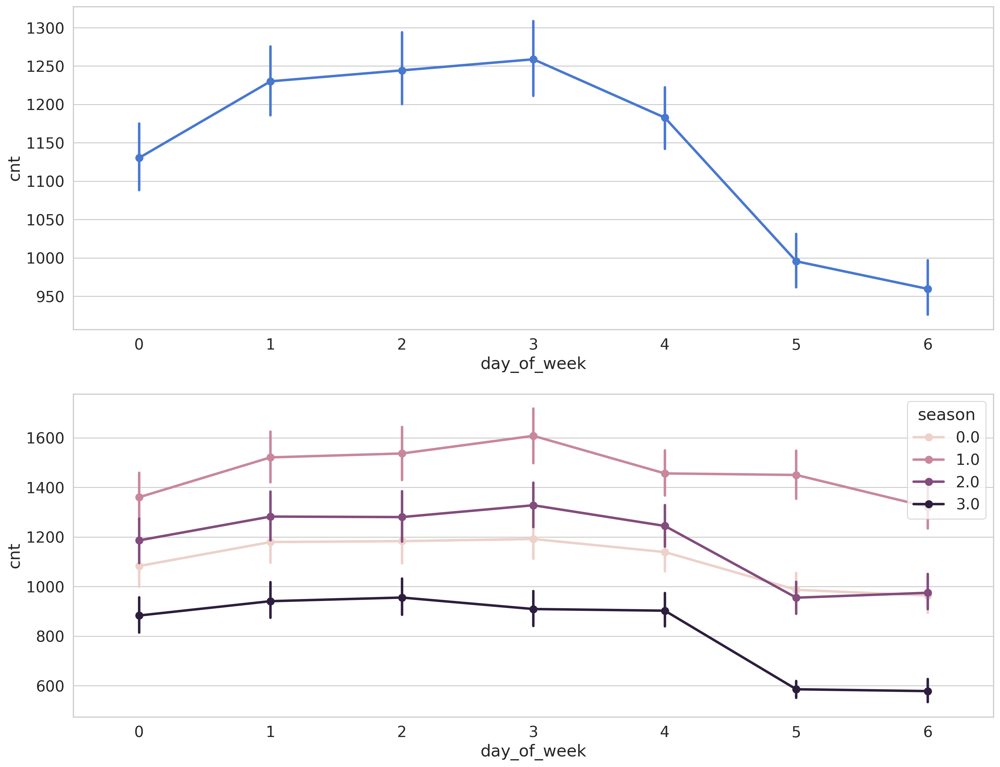

In [30]:
fig,(ax1, ax2)= plt.subplots(nrows=2)
fig.set_size_inches(18, 14)

sns.pointplot(data=demand_data, x='day_of_week', y='cnt', ax=ax1)
sns.pointplot(data=demand_data, x='day_of_week', y='cnt', hue='season', ax=ax2);

In [ ]:
#
demand_data['weather_code'] = demand_data['weather_code'].astype('int').astype('str')
demand_data['weather_code'].value_counts()

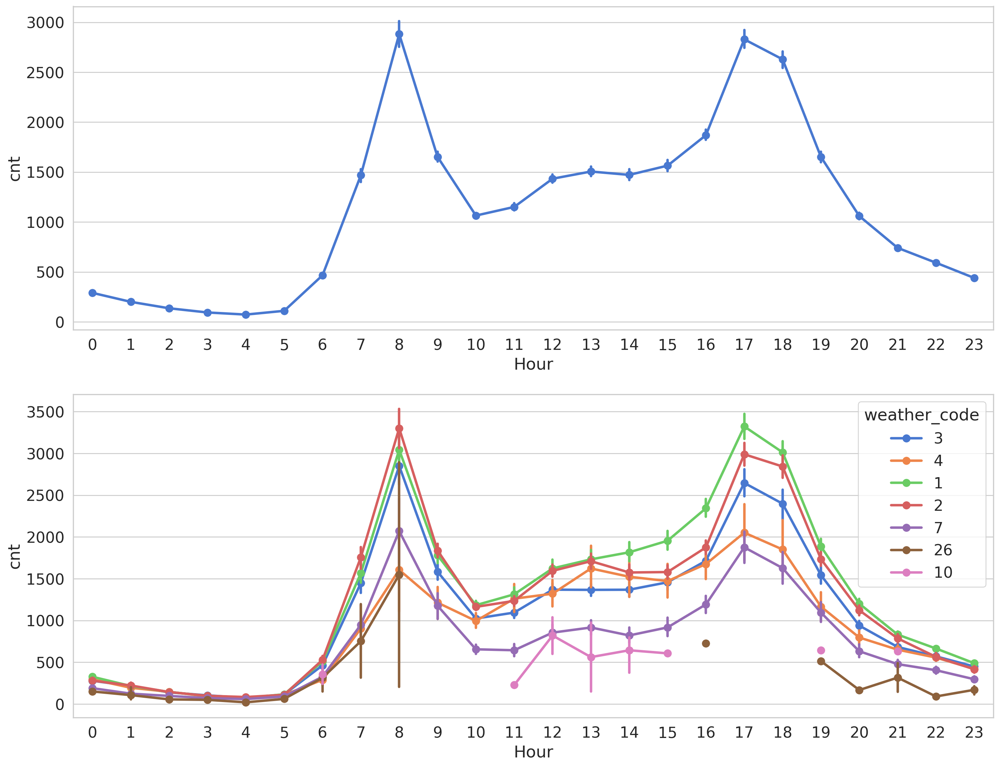

In [33]:
fig,(ax1, ax2)= plt.subplots(nrows=2)
fig.set_size_inches(18, 14)

sns.pointplot(data=demand_data, x='Hour', y='cnt', ax=ax1)
sns.pointplot(data=demand_data, x='Hour', y='cnt', hue='weather_code', ax=ax2); # hard to judge exactly which weather is ideal but generally higher code means bad weather hence low rentals
#1 = Clear ; mostly clear but have some values with haze/fog/patches of fog/ fog in vicinity
#2 = scattered clouds / few clouds
#3 = Broken clouds
#4 = Cloudy
#7 = Rain/ light Rain shower/ Light rain
#10 = rain with thunderstorm
#26 = snowfall 94 = Freezing Fog

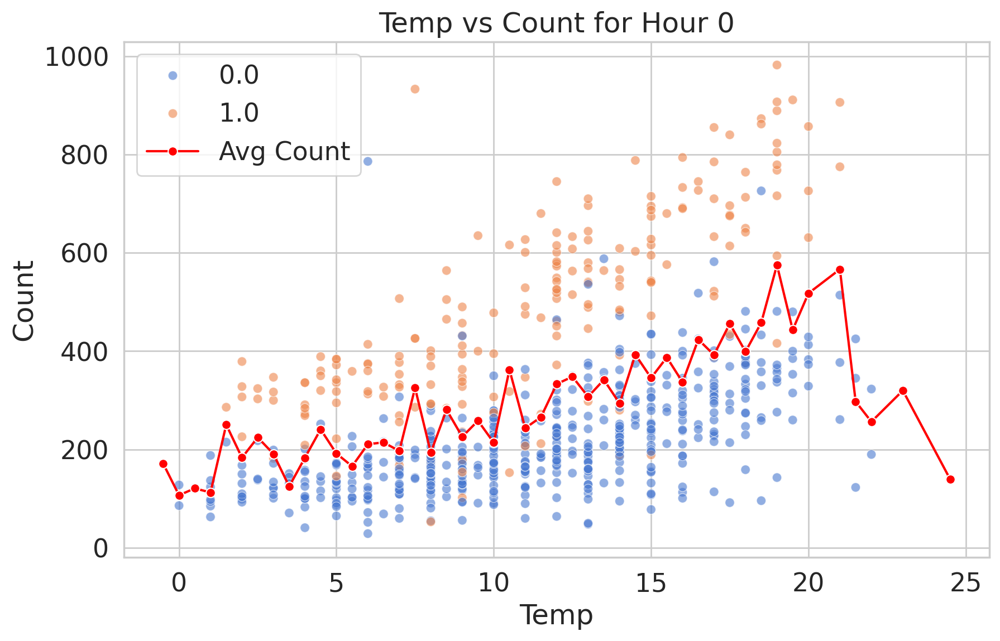

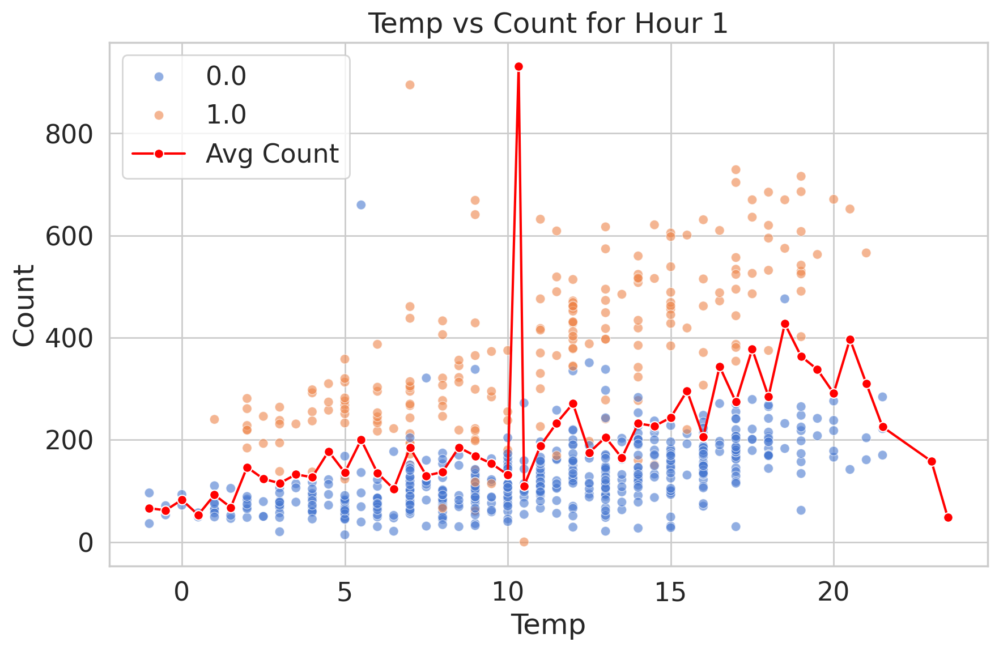

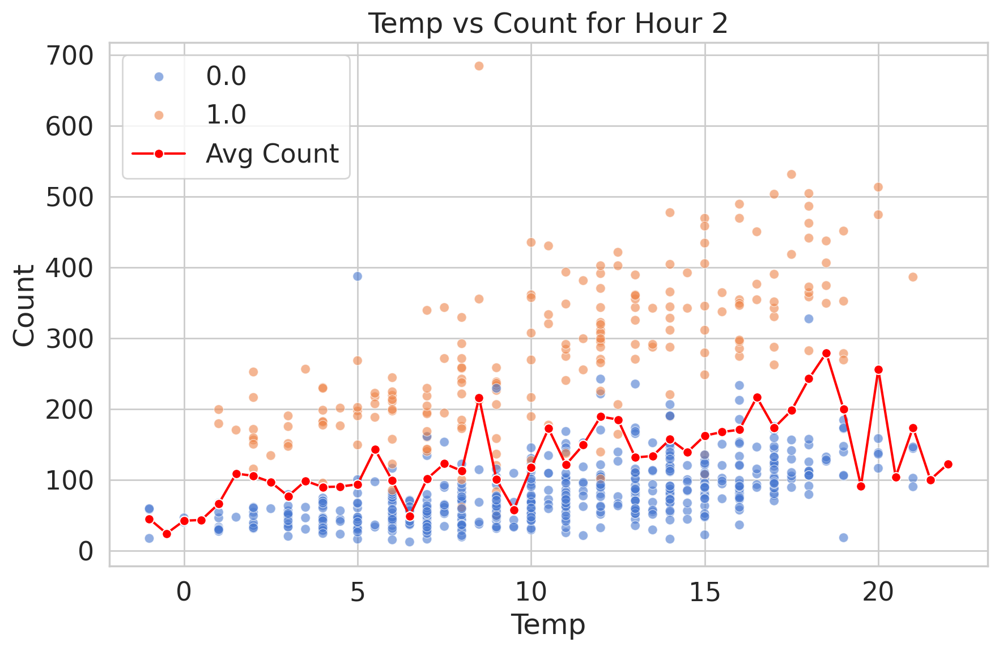

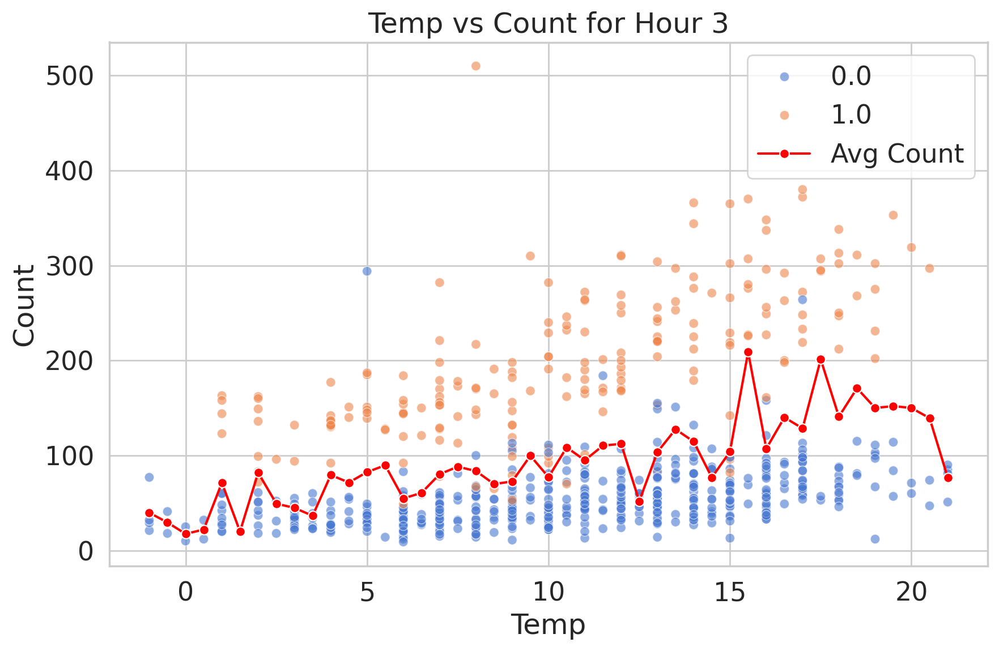

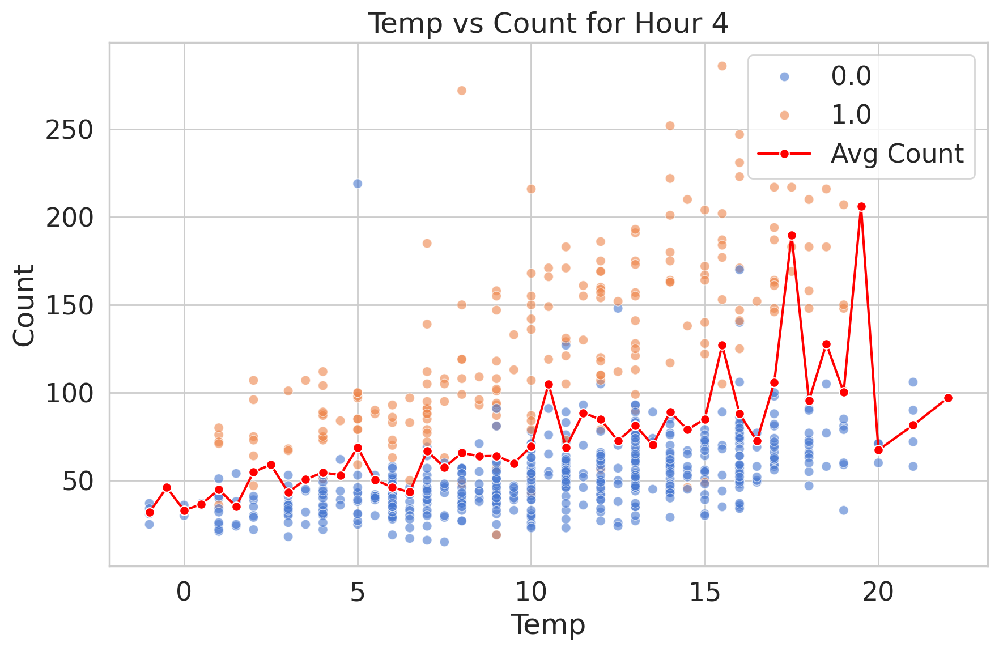

...

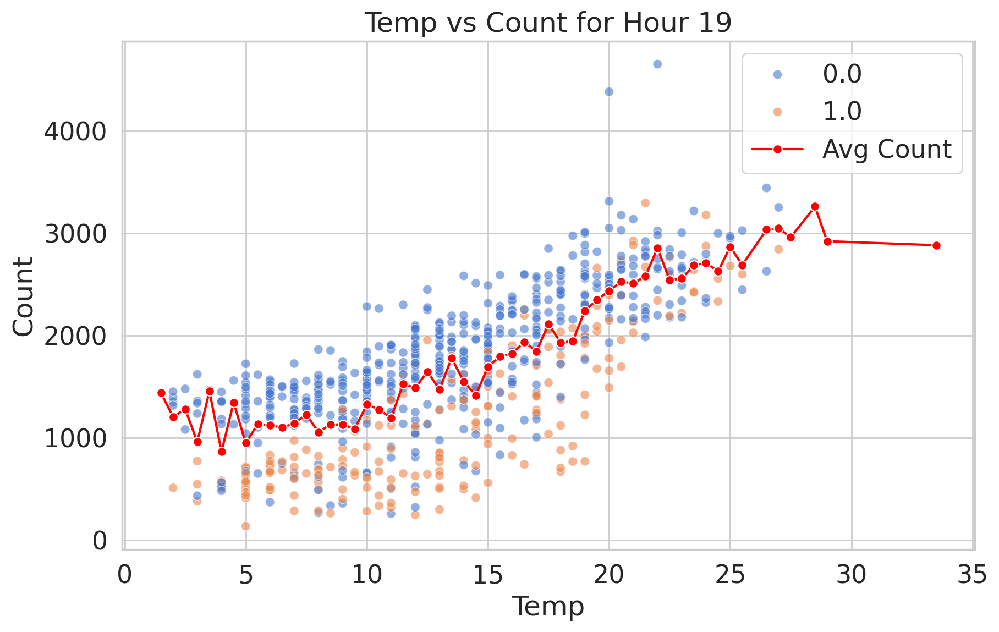

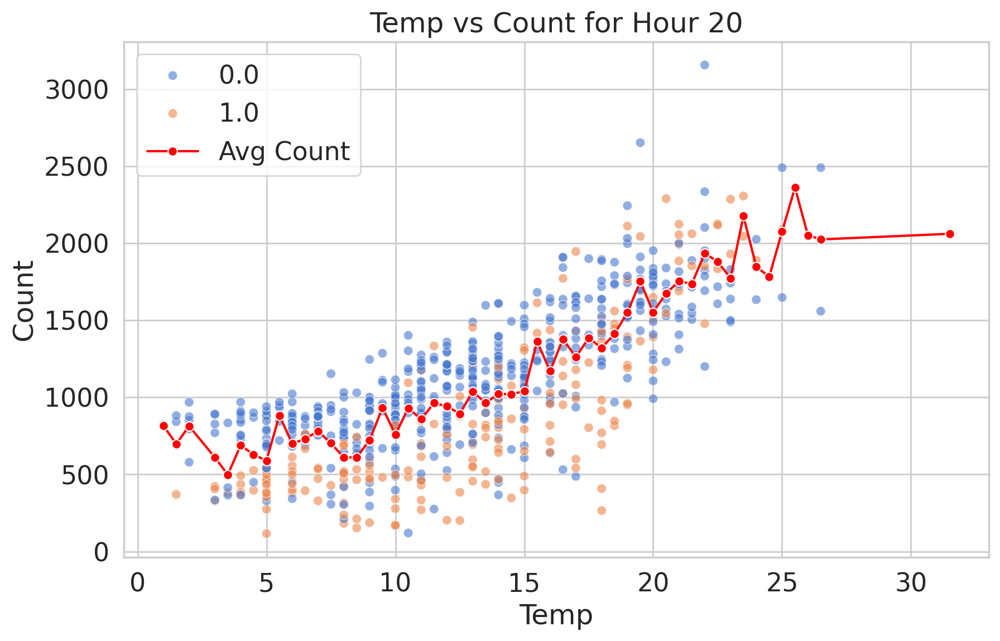

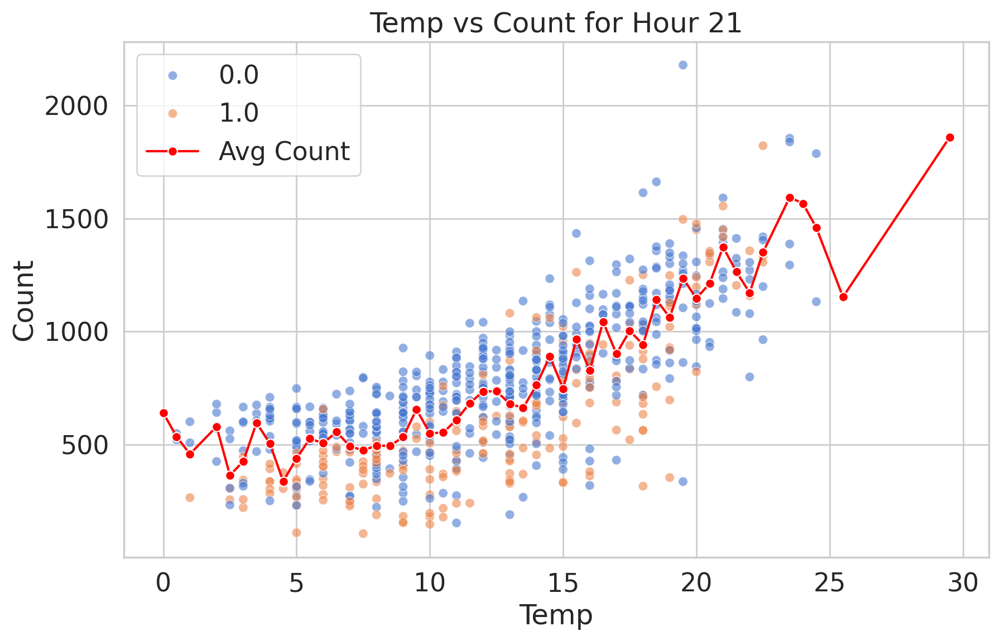

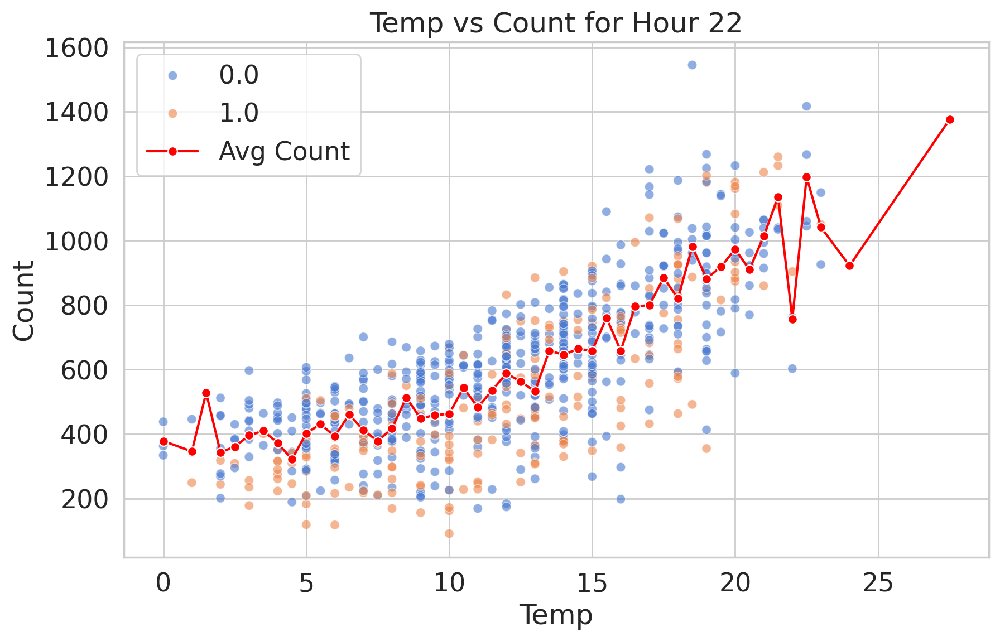

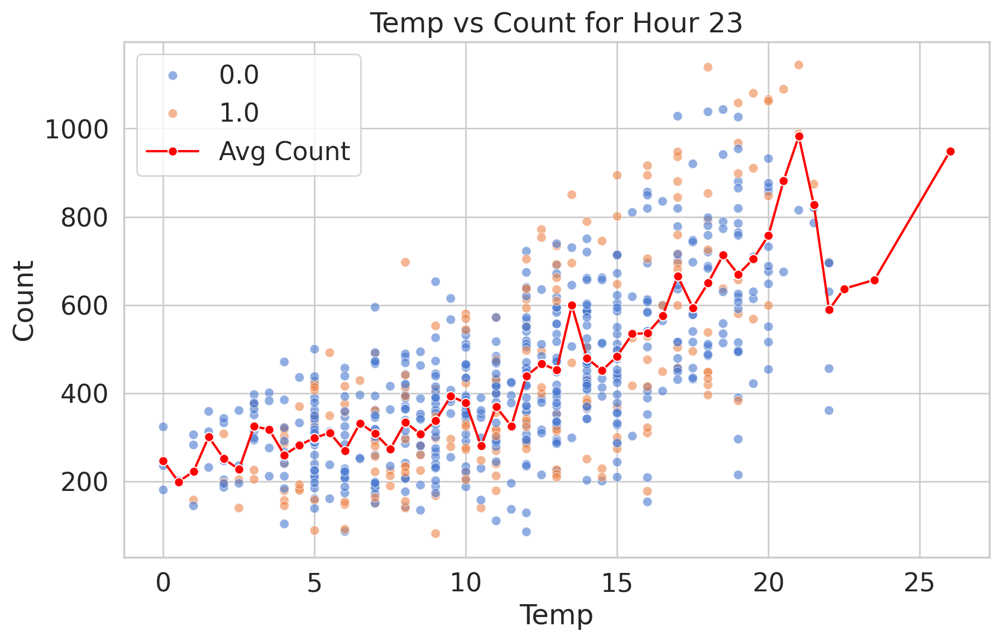

In [42]:
unique_hours = demand_data['Hour'].unique()

# Sort the hours to plot in order
unique_hours.sort()
for hour in unique_hours:
    # Filter the DataFrame for the specific hour
    df_hour = demand_data[demand_data['Hour'] == hour]

    # Calculate the average count ('cnt') per humidity level for the current hour
    avg_cnt_per_tem = df_hour.groupby('t1')['cnt'].mean().reset_index()

    # Set up subplots for side-by-side comparison
    plt.figure(figsize=(10, 6))

    sns.scatterplot(x='t1', y='cnt', hue='is_weekend', data=df_hour, alpha=0.6)

    # Overlay the line chart for the average count vs. humidity
    sns.lineplot(x='t1', y='cnt', data=avg_cnt_per_tem, color='red', marker='o', label='Avg Count')

    # Adding titles and labels for clarity
    plt.title(f'Temp vs Count for Hour {hour}')
    plt.xlabel('Temp')
    plt.ylabel('Count')

    # Display the plot
    plt.legend()
    plt.show()

In [ ]:
unique_hours = demand_data['Hour'].unique()

# Sort the hours to plot in order
unique_hours.sort()
for hour in unique_hours:
    # Filter the DataFrame for the specific hour
    df_hour = demand_data[demand_data['Hour'] == hour]

    # Calculate the average count ('cnt') per humidity level for the current hour
    avg_cnt_per_hum = df_hour.groupby('hum')['cnt'].mean().reset_index()

    # Set up subplots for side-by-side comparison
    plt.figure(figsize=(10, 6))

    sns.scatterplot(x='hum', y='cnt', hue='is_weekend', data=df_hour, alpha=0.6)

    # Overlay the line chart for the average count vs. humidity
    sns.lineplot(x='hum', y='cnt', data=avg_cnt_per_hum, color='red', marker='o', label='Avg Count')

    # Adding titles and labels for clarity
    plt.title(f'Humidity vs Count for Hour {hour}')
    plt.xlabel('Humidity')
    plt.ylabel('Count')

    # Display the plot
    plt.legend()
    plt.show()

    #demand decreases with increase in humidity particularly in later part of the day

In [ ]:
unique_hours = demand_data['Hour'].unique()

# Sort the hours to plot in order
unique_hours.sort()
for hour in unique_hours:
    # Filter the DataFrame for the specific hour
    df_hour = demand_data[demand_data['Hour'] == hour]

    # Calculate the average count ('cnt') per humidity level for the current hour
    avg_cnt_per_wind = df_hour.groupby('wind_speed')['cnt'].mean().reset_index()

    # Set up subplots for side-by-side comparison
    plt.figure(figsize=(10, 6))

    sns.scatterplot(x='wind_speed', y='cnt', hue='is_weekend', data=df_hour, alpha=0.6)

    # Overlay the line chart for the average count vs. humidity
    sns.lineplot(x='wind_speed', y='cnt', data=avg_cnt_per_wind, color='red', marker='o', label='Avg Count')

    # Adding titles and labels for clarity
    plt.title(f'Wind Speed vs Count for Hour {hour}')
    plt.xlabel('Wind Speed')
    plt.ylabel('Count')

    # Display the plot
    plt.legend()
    plt.show()
#cant really say there is a trend but intuitively demand should decrease with increase in wind speed may be

# Correlation Matrix

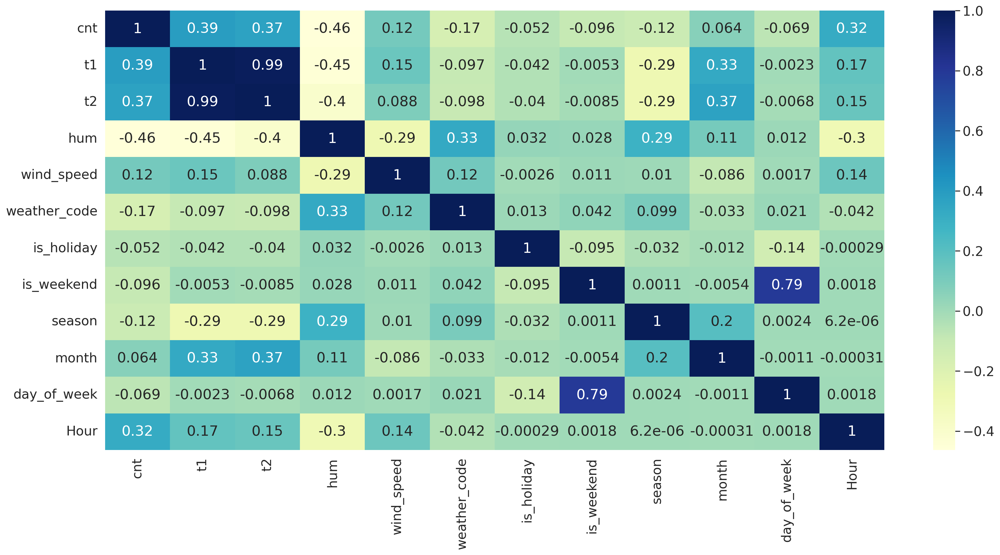

In [45]:
# prompt: get the correlation of features in demand data as a heatmap

sns.heatmap(demand_data.corr(),cmap="YlGnBu", annot=True)
plt.show()
#t1 & t2 are highly correlated we can remove one
# we can remove is weekend and keep day of week as one hot encoded? due to variations within weekdays vs weekends as well
#some degree of correlation between temperature and humidity - need to apply PCA?

#One hot encoding

In [ ]:
final_data = demand_data.drop(['t2','is_weekend'], axis=1)
final_data.info()

In [ ]:
# prompt: use the final_data and perform one hot encoding onweather code, is_holiday, season and append the encoded variables inplace of original

final_data = pd.get_dummies(final_data, columns=['weather_code', 'is_holiday', 'season'], drop_first=True)
final_data.info()
#weather=1, holiday=0, season =0 are base values

In [ ]:
# prompt: convert bool to int wherever a column is bool type
# handle bool datatype to avoiud issues converting into a tensor in the model building
final_data[final_data.columns[final_data.dtypes == 'bool']] = final_data[final_data.columns[final_data.dtypes == 'bool']].astype(int)
final_data.info()


# Train and Test Split

In [62]:
#since i want to test the performance on out of time data im not shuffling(validation part should take care of it)
train_size = int(len(final_data) * 0.9)
test_size = len(final_data) - train_size
train, test = final_data.iloc[0:train_size], final_data.iloc[train_size:len(final_data)]
print(len(train), len(test))

15672 1742


# Feature transformation

In [ ]:
from sklearn.preprocessing import RobustScaler

f_columns = ['t1', 'hum', 'wind_speed']

#f_transformer = RobustScaler()
feature_transformer = RobustScaler()
cnt_transformer = PowerTransformer(method='yeo-johnson')

feature_transformer = feature_transformer.fit(train[f_columns].to_numpy())
cnt_transformer = cnt_transformer.fit(train[['cnt']])

train.loc[:, f_columns] = feature_transformer.transform(train[f_columns].to_numpy())
train['cnt'] = cnt_transformer.transform(train[['cnt']])

test.loc[:, f_columns] = feature_transformer.transform(test[f_columns].to_numpy())
test['cnt'] = cnt_transformer.transform(test[['cnt']])

# Create Sub sequence dataset for model building

In [57]:
def create_dataset(X, y, time_steps=1):
    Xs, ys = [], []

    for i in range(len(X) - time_steps):
        #subsequence starting at 1 to i+time_steps - dim: time_steps x features
        v = X.iloc[i:(i + time_steps)].values
        #append the sub sequence to the list - dim: (len-time_steps)x time_steps x features
        Xs.append(v)
        ys.append(y.iloc[i + time_steps])
    return np.array(Xs), np.array(ys)

In [64]:
time_steps = 24

# reshape to [samples, time_steps, n_features]

X_train, y_train = create_dataset(train, train.cnt, time_steps)
X_test, y_test = create_dataset(test, test.cnt, time_steps)

print(X_train.shape, y_train.shape)

(15648, 24, 17) (15648,)


# Creating the model architechture for Bidirectional LSTM with 128 units in the hidden layer

In [59]:
model = keras.Sequential()
model.add(
  keras.layers.Bidirectional(
    keras.layers.LSTM(
      units=128,
      input_shape=(X_train.shape[1], X_train.shape[2])
    )
  )
)
model.add(keras.layers.Dropout(rate=0.2)) # masking 20% of the data in each forward step to avoid overfitting
model.add(keras.layers.Dense(units=1)) #final output layer
model.compile(loss='mean_squared_error', optimizer='adam')

In [ ]:
history = model.fit(
    X_train, y_train,
    epochs=20,
    batch_size=32,
    validation_split=0.1,
    shuffle=False
)

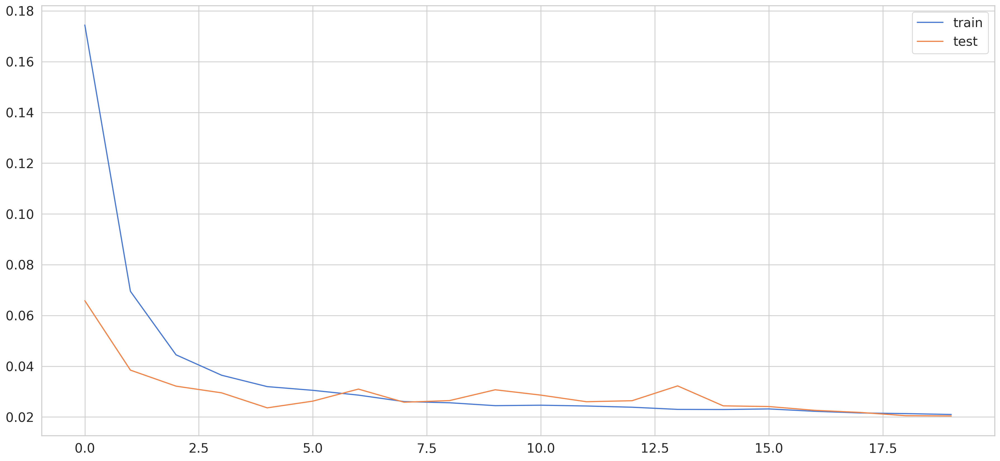

In [66]:
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend();

In [ ]:
y_pred = model.predict(X_test)

In [70]:
y_pred.shape

(1718, 1)

In [69]:
y_train.shape

(15648,)

In [ ]:
y_train_inv = cnt_transformer.inverse_transform(y_train.reshape(-1, 1))
y_test_inv = cnt_transformer.inverse_transform(y_test.reshape(-1, 1))


In [ ]:

y_pred_inv = cnt_transformer.inverse_transform(y_pred)

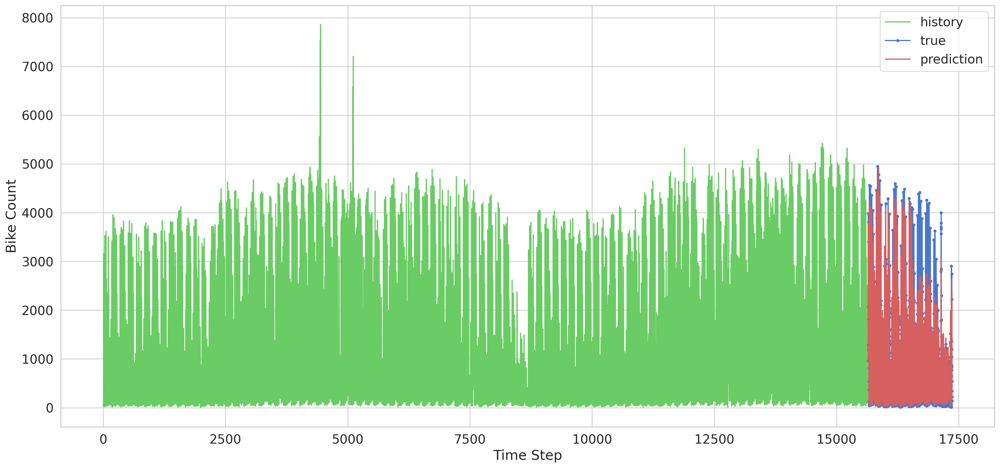

In [75]:

plt.plot(np.arange(0, len(y_train)), y_train_inv.flatten(), 'g', label="history")
plt.plot(np.arange(len(y_train), len(y_train) + len(y_test)), y_test_inv.flatten(), marker='.', label="true")
plt.plot(np.arange(len(y_train), len(y_train) + len(y_test)), y_pred_inv.flatten(), 'r', label="prediction")
plt.ylabel('Bike Count')
plt.xlabel('Time Step')
plt.legend()
plt.show();

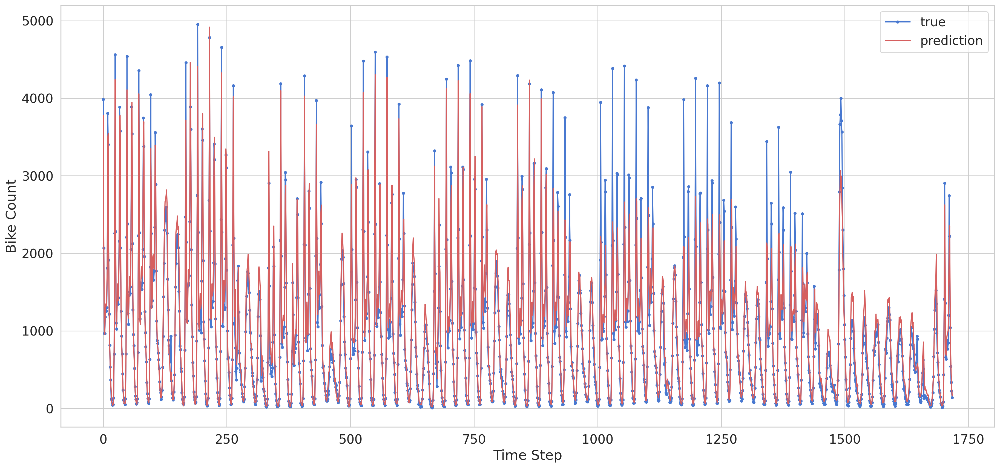

In [76]:
plt.plot(y_test_inv.flatten(), marker='.', label="true")
plt.plot(y_pred_inv.flatten(), 'r', label="prediction")
plt.ylabel('Bike Count')
plt.xlabel('Time Step')
plt.legend()
plt.show();
#the model is initially fitting well but performs poorly on extreme values in the later half. Why?

In [87]:


mse_test = np.mean((y_test-y_pred.flatten())**2)

print(mse_test)


0.0360858510352929


# Try a simpler network to see if it generalizes well

In [88]:
model2 = keras.Sequential()
model2.add(
  keras.layers.Bidirectional(
    keras.layers.LSTM(
      units=64,
      input_shape=(X_train.shape[1], X_train.shape[2])
    )
  )
)
model2.add(keras.layers.Dropout(rate=0.2)) # masking 20% of the data in each forward step to avoid overfitting
model2.add(keras.layers.Dense(units=1)) #final output layer
model2.compile(loss='mean_squared_error', optimizer='adam')

In [91]:
history2 = model2.fit(
    X_train, y_train,
    epochs=20,
    batch_size=32,
    validation_split=0.1,
    shuffle=False
)

Epoch 1/20
441/441 [==============================] - 17s 28ms/step - loss: 0.2161 - val_loss: 0.0671
Epoch 2/20
441/441 [==============================] - 11s 25ms/step - loss: 0.0830 - val_loss: 0.0429
Epoch 3/20
441/441 [==============================] - 11s 25ms/step - loss: 0.0569 - val_loss: 0.0329
Epoch 4/20
441/441 [==============================] - 11s 26ms/step - loss: 0.0458 - val_loss: 0.0280
Epoch 5/20
441/441 [==============================] - 11s 26ms/step - loss: 0.0411 - val_loss: 0.0270
Epoch 6/20
441/441 [==============================] - 11s 25ms/step - loss: 0.0377 - val_loss: 0.0256
Epoch 7/20
441/441 [==============================] - 10s 23ms/step - loss: 0.0348 - val_loss: 0.0239
Epoch 8/20
441/441 [==============================] - 11s 25ms/step - loss: 0.0318 - val_loss: 0.0250
Epoch 9/20
441/441 [==============================] - 11s 26ms/step - loss: 0.0315 - val_loss: 0.0254
Epoch 10/20
441/441 [==============================] - 11s 26ms/step - loss: 0.030

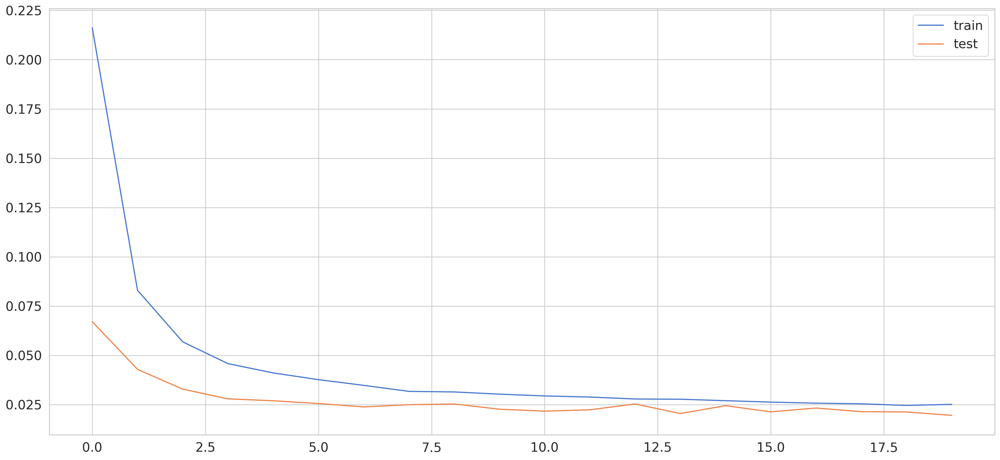

In [92]:
plt.plot(history2.history['loss'], label='train')
plt.plot(history2.history['val_loss'], label='test')
plt.legend();

In [ ]:
y_pred2 = model2.predict(X_test)

In [ ]:
y_pred_inv2 = cnt_transformer.inverse_transform(y_pred2)

In [ ]:

plt.plot(np.arange(0, len(y_train)), y_train_inv.flatten(), 'g', label="history")
plt.plot(np.arange(len(y_train), len(y_train) + len(y_test)), y_test_inv.flatten(), marker='.', label="true")
plt.plot(np.arange(len(y_train), len(y_train) + len(y_test)), y_pred_inv2.flatten(), 'r', label="prediction")
plt.ylabel('Bike Count')
plt.xlabel('Time Step')
plt.legend()
plt.show();

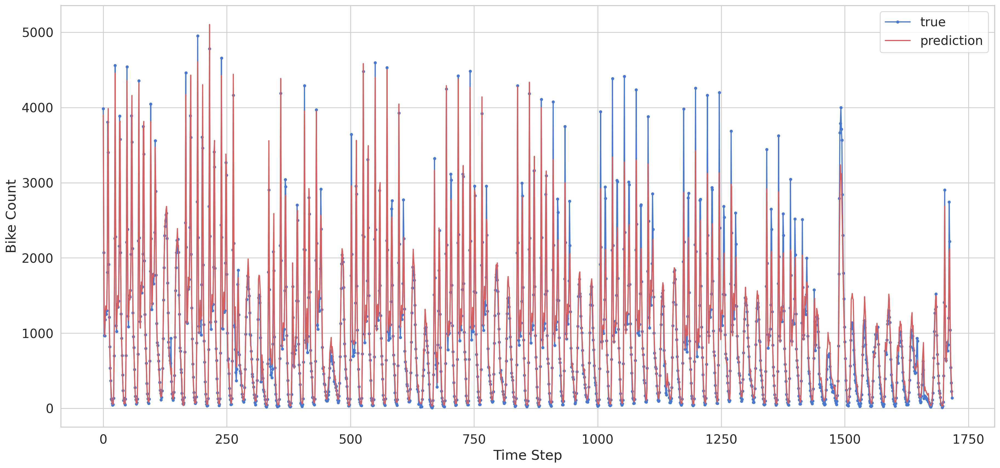

In [96]:
plt.plot(y_test_inv.flatten(), marker='.', label="true")
plt.plot(y_pred_inv2.flatten(), 'r', label="prediction")
plt.ylabel('Bike Count')
plt.xlabel('Time Step')
plt.legend()
plt.show();

In [99]:


mse_test2 = np.mean((y_test-y_pred2.flatten())**2)

print(mse_test2)
#this is performing better than 128 unit layer

0.03353868270121118


# Trying an even simpler model with 32 units

In [114]:
model3 = keras.Sequential()
model3.add(
  keras.layers.Bidirectional(
    keras.layers.LSTM(
      units=32,
      input_shape=(X_train.shape[1], X_train.shape[2])
    )
  )
)
model3.add(keras.layers.Dropout(rate=0.2)) # masking 20% of the data in each forward step to avoid overfitting
model3.add(keras.layers.Dense(units=1)) #final output layer
model3.compile(loss='mean_squared_error', optimizer='adam')

In [ ]:
history3 = model3.fit(
    X_train, y_train,
    epochs=20,
    batch_size=64,
    validation_split=0.1,
    shuffle=False
)

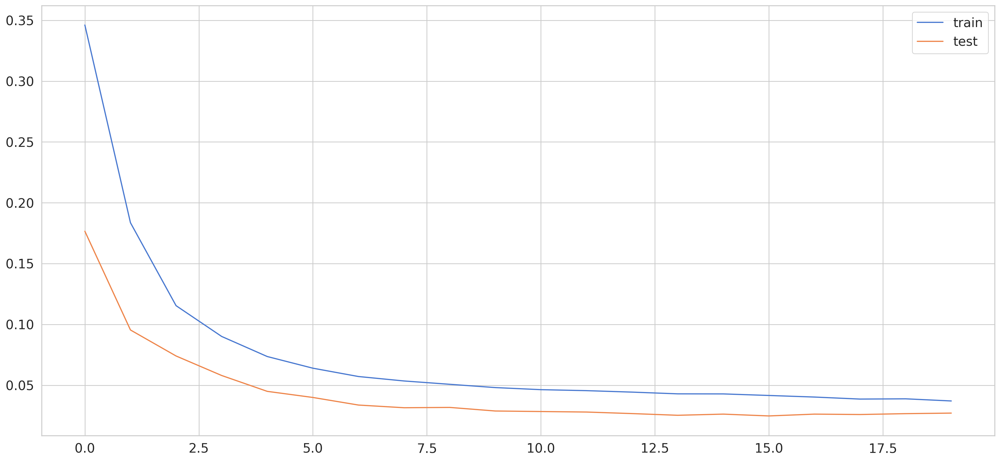

In [121]:
plt.plot(history3.history['loss'], label='train')
plt.plot(history3.history['val_loss'], label='test')
plt.legend();

In [ ]:
y_pred3 = model3.predict(X_test)
y_pred_inv3 = cnt_transformer.inverse_transform(y_pred3)

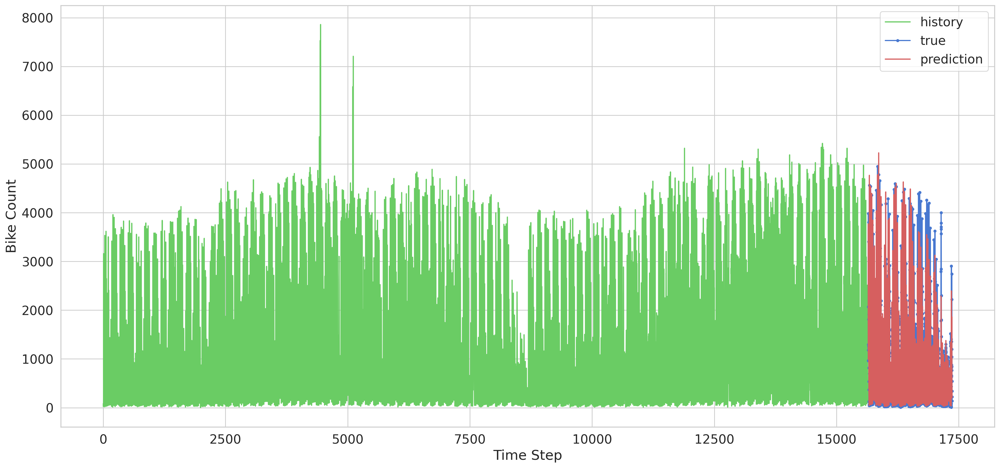

In [123]:
plt.plot(np.arange(0, len(y_train)), y_train_inv.flatten(), 'g', label="history")
plt.plot(np.arange(len(y_train), len(y_train) + len(y_test)), y_test_inv.flatten(), marker='.', label="true")
plt.plot(np.arange(len(y_train), len(y_train) + len(y_test)), y_pred_inv3.flatten(), 'r', label="prediction")
plt.ylabel('Bike Count')
plt.xlabel('Time Step')
plt.legend()
plt.show();

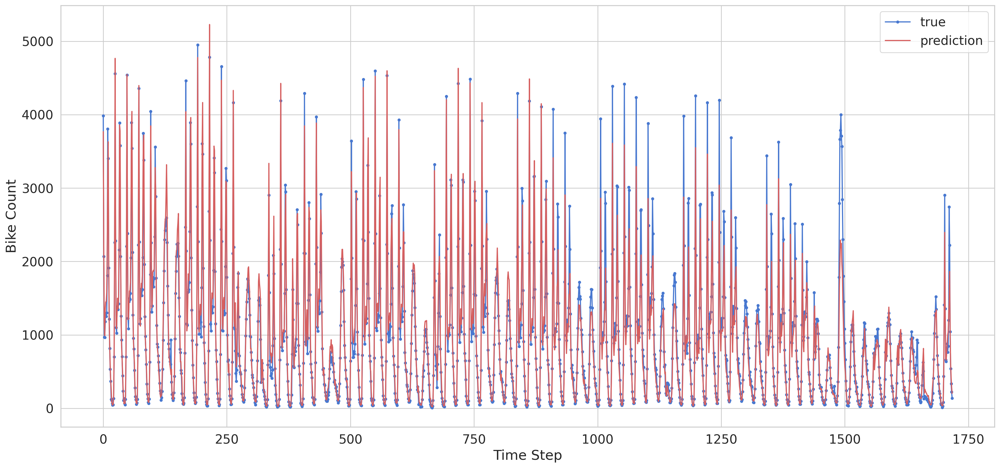

In [124]:
plt.plot(y_test_inv.flatten(), marker='.', label="true")
plt.plot(y_pred_inv3.flatten(), 'r', label="prediction")
plt.ylabel('Bike Count')
plt.xlabel('Time Step')
plt.legend()
plt.show();

In [125]:
mse_test3 = np.mean((y_test-y_pred3.flatten())**2)

print(mse_test3)
#this is performing better than 64 unit layer
#0.03248800769570053 at 20 epochs. Let me try 30 epochs
#0.037154644820465814 at 30 epochs.
#Trying 20 epochs with higher batch size
#0.0322560354559069 at 20 epochs and batch size 64

0.0322560354559069


Still need to understand why the model is performing poorly on later times.
Is it expected in time series as we look farther into the future the more uncertain out prediction is?
So the model is reliable for the next 1-2 months

#Takeaways

1.   The model can be further improved through hyper paramter tuning
2.   We can use the results to predict upto the next 30 days with better accuracy.
3.  Could explore simple stat based models such as Arima, Sarimax, TBATS to estimate baseline performance.
4. Additional data around bike availability, stock outages etc or creating additional features could provide more accurate forecasts



In [142]:
demand_data['day_of_month'] = demand_data.index.day

In [143]:
avg_cnt_by_day = demand_data.groupby('day_of_month')['cnt'].mean().reset_index()


In [ ]:
sns.lineplot(x='day_of_month', y='cnt', data=avg_cnt_by_day)
plt.xlabel('Day of the Month')
plt.ylabel('Average Count')
plt.title('Average Count by Day of the Month')
plt.xticks(range(1, 32))  # Ensure x-axis ticks cover each day of the month
plt.grid(True)
plt.show()